<a href="https://colab.research.google.com/github/KARINAgoncalvesSOARES/python_intermediario/blob/main/visualizacao_da_informacao.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1 aling='center'>Análise exploratória de dados (EDA)
                    Preço do Combustível no Brasil<h1>

Cientista de dados: Karina Gonçalves Soares

Links de estudo:
* [Gas Prices in Brazil: EDA](https://www.kaggle.com/code/rafanthx13/gas-prices-in-brazil-eda/notebook#notebook-container)

* [Dataset](https://jovian.com/tomcerginer/preco-gas-brasil/v/14/files?filename=gas-prices-in-brazil/2004-2019.tsv)

* [brazil-states.geojson](https://github.com/codeforgermany/click_that_hood/blob/main/public/data/brazil-states.geojson)


Preços do combustível no Brasil: EDA

A Agência Nacional do Petróleo, Gás Natural e Biocombustíveis (ANP) divulga relatórios semanais dos preços do gás, diesel e outros combustíveis utilizados no transporte em todo o país. Esses conjuntos de dados trazem o valor médio por litro, número de postos de gasolina analisados e outras informações agrupadas por regiões e estados em todo o país.

###Importando bibliotecas e Dataset 

In [1]:
import numpy as np # Trabalha com arrays e cálculos numéricos
import random # Funções para gerar mnúmeros aleatórios
import pandas as pd # Manipulação e análise de dados
import matplotlib.pyplot as plt # Visualização dos dados
#%matplotlib inline # Habilita exibição inline dos gráficos no próprio notebook
import seaborn as sns # Complemento do matplotbib, visualização de dados.

# Bokeh
from bokeh.io import output_notebook # Configura os gráficos do Bokeh para serem exíbidos no notebook
from bokeh.models import GeoJSONDataSource # Trabalha com dados Geoespaciais do Bokeh
output_notebook()

# Imprimir caminhos do DataSet
#import os # Funções para trabalhar com o Sistema Operacional
#for dirname, _, filenames in os.walk('/kaggle/input'):
    #for filename in filenames:
        #print(os.path.join(dirname, filename))

# Configs
pd.options.display.float_format = '{:,.4f}'.format
sns.set(style="whitegrid")
SEED = 42
np.random.seed(SEED)
random.seed(SEED)


In [2]:
# Abrindo o Dataset para leitura
df = pd.read_csv("/content/drive/MyDrive/cruzeiro_do_sul/2004-2019.tsv", delimiter = '\t')

In [3]:
# Análisando as dimensões do DataFrame
df.shape

(106823, 21)

In [4]:
# Visualizando o conjunto de daddos
df.head(3)

,Unnamed: 0,DATA INICIAL,DATA FINAL,REGIÃO,ESTADO,PRODUTO,NÚMERO DE POSTOS PESQUISADOS,UNIDADE DE MEDIDA,PREÇO MÉDIO REVENDA,DESVIO PADRÃO REVENDA,...,PREÇO MÁXIMO REVENDA,MARGEM MÉDIA REVENDA,COEF DE VARIAÇÃO REVENDA,PREÇO MÉDIO DISTRIBUIÇÃO,DESVIO PADRÃO DISTRIBUIÇÃO,PREÇO MÍNIMO DISTRIBUIÇÃO,PREÇO MÁXIMO DISTRIBUIÇÃO,COEF DE VARIAÇÃO DISTRIBUIÇÃO,MÊS,ANO
0,0,2004-05-09,2004-05-15,CENTRO OESTE,DISTRITO FEDERAL,ETANOL HIDRATADO,127,R$/l,1.2880,0.0160,...,1.3500,0.463,0.0120,0.825,0.11,0.4201,0.9666,0.133,5,2004
1,1,2004-05-09,2004-05-15,CENTRO OESTE,GOIAS,ETANOL HIDRATADO,387,R$/l,1.1620,0.1140,...,1.4490,0.399,0.0980,0.763,0.088,0.5013,1.05,0.115,5,2004
2,2,2004-05-09,2004-05-15,CENTRO OESTE,MATO GROSSO,ETANOL HIDRATADO,192,R$/l,1.3890,0.0970,...,1.7600,0.419,0.0700,0.97,0.095,0.5614,1.161,0.098,5,2004


###Funções

In [5]:
def eda_categ_feat_desc_plot(series_categorical, title = "", fix_labels=False):
   
    """Gera 2 gráficos: barplot com quantidade e pieplot com porcentagem.
        @series_categorical: série categórica
        @title: opcional
        @fix_labels: Os labels plotados no barplot são classificados por valores,
        algumas vezes ocorrem bugs porque os ticks do eixo são alfabéticos
            se isso acontecer, passe True em fix_labels
        @bar_format: passar {:,.0f} para int
     """

    series_name = series_categorical.name
    val_counts = series_categorical.value_counts() # Fazendo a contagem de cada categoria
    val_counts.name = 'quantity' # Renomeando a coluna das contagens 
    val_percentage = series_categorical.value_counts(normalize=True) # Calculando porcentagem relativa a cada categoria com o parâmetro "normalize=True"
    val_percentage.name = "percentage"
    val_concat = pd.concat([val_counts, val_percentage], axis = 1)
    val_concat.reset_index(level=0, inplace=True)
    val_concat = val_concat.rename( columns = {'index': series_name} )
    
    fig, ax = plt.subplots(figsize = (15,4), ncols=2, nrows=1) # figsize = (width, height) # Conjunto de subplots
    # Ajustando o título
    if(title != ""):
        fig.suptitle(title, fontsize=18)
        fig.subplots_adjust(top=0.8)

     # Criando Gráfico de barras
    s = sns.barplot(x=series_name, y='quantity', data=val_concat, ax=ax[0])
     # Se fix_labels for True as categorias serão reordenadas em ordem alfabética
    if(fix_labels):
        val_concat = val_concat.sort_values(series_name).reset_index()
    
    for index, row in val_concat.iterrows():
        s.text(row.name, row['quantity'], '{:,d}'.format(row['quantity']), color='black', ha="center")

    s2 = val_concat.plot.pie(y='percentage', autopct=lambda value: '{:.2f}%'.format(value), # Formatando exibição das porcentagens com 2 casas decimais
                             labels=val_concat[series_name].tolist(), legend=None, ax=ax[1], # Função anônima que representa o valor da fatia
                             title="Gráfico de porcentagem")

    ax[1].set_ylabel('')
    ax[0].set_title('Gráfico de quantidade')

    plt.show()

In [6]:
# Removendo valores discrepantes

def series_remove_outiliers(series):
    # Usar estratégia de IQR (Intervalo Interquartil)
    # https://machinelearningmastery.com/how-to-use-statistics-to-identify-outliers-in-data/
    # def quartis
    q25, q75 = series.quantile(0.25), series.quantile(0.75)
    iqr = q75 - q25
    print('Percentiles: 25th=%.3f, 75th=%.3f, IQR=%.3f' % (q25, q75, iqr))
    cut_off = iqr * 1.5
    lower, upper = q25 - cut_off, q75 + cut_off
    # identificar valores discrepantes
    print('Cut Off: below than', lower, 'and above than', upper)
    outliers = series[ (series > upper) | (series < lower)]
    print('Identified outliers: {:,d}'.format(len(outliers)), 'that are',
          '{:.2%}'.format(len(outliers)/len(series)), 'of total data')
    # remove outliers
    outliers_removed = [x for x in series if x >= lower and x <= upper]
    print('Non-outlier observations: {:,d}'.format(len(outliers_removed)))
    series_no_outiliers = series[ (series <= upper) & (series >= lower) ]
    return series_no_outiliers

In [7]:
from bokeh.io import show
from bokeh.plotting import figure
from bokeh.models import LinearColorMapper, HoverTool, ColorBar
from bokeh.palettes import magma,viridis,cividis, inferno

def eda_brazil_state_geo_plot(geosource, df_in, title, column, state_column, low = -1, high = -1, palette = -1):
  
    """
     Gerar Bokeh Plot para os Estados do Brasil:
         geosource: GeoJSONDataSource de Bokeh
         df_in: DataSet antes de ser transformado em GeoJSONDataSource
         title: título do enredo
         column: coluna de df_in para colocar os valores no geoplot
         state_column: indica a coluna com os nomes dos Estados
         low = (opcional) valor mínimo do intervalo do espectro de cores
         high = (opcional) valores máximos de intervalo de espectro de cor
         palette: (opcional) pode ser magma, viridis, civis, inferno e etc. (com número de cores)
             Exemplo: cividis(8) (8 cores para classificar), cividis(256) (256, mais cores para classificar)
     """

    #Verifica se valores min e max foram definidos, se não forem definidos detrmina automaticamente
    if high == -1:
        high = max(df_in[column])
    if low == -1:
        low = min(df_in[column])

    # Verifica se a paleta de cores foi fornecida, caso não tenha sido definida, utiliza paleta de cores "inferno"
    if palette == -1:
        palette = inferno(32)

    # Mapeia os valores das colunas específicadas  para as cores da paleta definida.    
    palette = palette[::-1]
    color_mapper = LinearColorMapper(palette = palette, low = low, high = high)
    
    # Exibi informações em um tooltip ao passar o mouse sobre os estados do mapa
    hover = HoverTool(tooltips = [ ('State','@{'+state_column+'}'), (column, '@{'+column+'}{%.2f}')],
                  formatters={'@{'+column+'}' : 'printf'})

    # Representa a escala de cor definida anteriormente
    color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8, width = 300, height = 20, 
                         border_line_color=None, location = (0,0),  orientation = 'horizontal')

    # Criando o mapa
    p = figure(title = title, plot_height = 430, plot_width = 330, tools = [hover])

    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    p.xaxis.visible = False
    p.yaxis.visible = False

    p.patches('xs','ys', source = geosource, line_color = 'black', line_width = 0.25,
              fill_alpha = 1, fill_color = {'field' : str(column), 'transform' : color_mapper})

    p.add_layout(color_bar, 'below')
    return p   

In [8]:
from bokeh.palettes import Turbo256 
from bokeh.models import ColumnDataSource
from bokeh.transform import factor_cmap
from bokeh.palettes import magma,viridis,cividis, inferno

def eda_bokeh_horiz_bar_ranked(df, column_target, title = '', int_top = 3, second_target = 'state'):
    
    """
     Gere os melhores punhos e o último valor da classificação do Bokeh Plot:
         df: data_frame
         column_targe: uma coluna de df inserida
         title: título do enredo
         int_top: número de topos
         column: coluna de df_in para colocar os valores no geoplot
         second_targe = 'estado'
     """

    ranked = df.sort_values(by=column_target).reset_index(drop = True) # Ordenando o df com base na coluna alvo
    top_int = int_top
    top = ranked[:top_int].append(ranked[-top_int:]).drop(['geometry'], axis = 1) # Selecionando primeiros e últimos valores
    top.index = top.index + 1 # Atualizando o índice do df para começar do 1 ao invés do 0
    source = ColumnDataSource(data=top)
    list_second_target = source.data[second_target].tolist() # Criando uma lista
    index_label = list_second_target[::-1] # invertendo as labels/ invertendo a ordem da lista

    #Criando gráfico de barras horizontais
    p = figure(plot_width=500, plot_height=300, y_range=index_label, 
                toolbar_location=None, title=title)   

    
    # turbo_pallete = Turbo256[0:256:int(256/len(list_second_target) - 2)][::-1] # proporcional ao número de barras
    p.hbar(y=second_target, right=column_target, source=source, height=0.85, line_color="#000000",
          fill_color=factor_cmap(second_target, palette=inferno(16)[::-1], factors=list_second_target))
    p.x_range.start = 0 # valor inicial do eixo x

    p.xaxis.axis_label = "value of '" + column_target + "'"

    hover = HoverTool() # iniciar ferramenta de foco, exibir informações em um tooltip ao passar o mouse sobre as barras do gráfico
    hover.tooltips = [("Value","R$ @{" + column_target + "}" ),   
                       ("Ranking","@index°")]

    hover.mode = 'hline' # defina o modo da ferramenta hover
    p.add_tools(hover)   # Adiciona o HoverTool ao gráfico

    return p # mostrar no bloco de notas

# Examplo
# show(eda_bokeh_horiz_bar_ranked(df = dfgeo_fuel_last_row['ETANOL HIDRATADO'], column_target = 'avg_price', title = 'AVG Gasolina',
#     int_top = 5, second_target = 'state') )

In [9]:
def describe_horizontal_serie(serie):
    adec = serie.describe()
    adtype = serie.dtype
    adf = pd.DataFrame(data=adec.values).T
    adf.columns = adec.index
    adf.index = pd.Index([adec.name])
    if(adtype in ['int64']):
        alist = ['min', '25%', '50%', '75%', 'max']
        for c in alist:
            adf[c] = adf[c].astype('int64')
            adf[c] = adf[c].map(lambda x: "{:,d}".format(int(x)))
    adf['count'] = adf['count'].map(lambda x: "{:,d}".format(int(x)))
    return adf

###Reestruturar conjunto de dados

In [10]:
# Renomeando colunas
df.rename(
    columns={
        "DATA INICIAL": "start_date",
        "DATA FINAL": "end_date",
        "REGIÃO": "region",
        "ESTADO": "state",
        "PRODUTO": "fuel",
        "NÚMERO DE POSTOS PESQUISADOS": "n_gas_stations",
        "UNIDADE DE MEDIDA": "unit",
        "PREÇO MÉDIO REVENDA": "avg_price",
        "DESVIO PADRÃO REVENDA": "sd_price",
        "PREÇO MÍNIMO REVENDA": "min_price",
        "PREÇO MÁXIMO REVENDA": "max_price",
        "MARGEM MÉDIA REVENDA": "avg_price_margin",
        "ANO": "year",
        "MÊS": "month",
        "COEF DE VARIAÇÃO DISTRIBUIÇÃO": "coef_dist",
        "PREÇO MÁXIMO DISTRIBUIÇÃO": "dist_max_price",
        "PREÇO MÍNIMO DISTRIBUIÇÃO": "dist_min_price",
        "DESVIO PADRÃO DISTRIBUIÇÃO": "dist_sd_price",
        "PREÇO MÉDIO DISTRIBUIÇÃO": "dist_avg_price",
        "COEF DE VARIAÇÃO REVENDA": "coef_price"
    },
    inplace=True
)

In [11]:
# converter várias unidades de medida para uma única
event_dictionary_units = {'R$/l ' : 'R$/l', 'R$/13Kg' : 'R$/l', 'R$/m3' : 'R$/l'}
event_dictionary_conversion = {'R$/l' : 1 , 'R$/13Kg' : 0.00006153, 'R$/m3' : 0.001}

df['conversion'] = df['unit'].map(event_dictionary_conversion) # nova coluna
df['avg_price'] = df.avg_price * df.conversion # converter avg_price para R$/l numérico
df['unit'] = df['unit'].map(event_dictionary_units)

In [12]:
# Converter para Número
numeric_columns = ['sd_price','min_price', 'max_price','avg_price_margin','coef_price', 
                        'dist_avg_price', 'dist_sd_price', 'dist_min_price', 'dist_max_price',
                        'coef_dist']
for col in numeric_columns:
  df[col] = pd.to_numeric(df[col], errors='coerce')

# Converter para colunas de data para DateTime
for col in ['start_date', 'end_date']:
    df[col] = pd.to_datetime(df[col]) 

In [13]:
# remove colunas inúteis
df = df.drop(["unit", "conversion", 'Unnamed: 0'], axis = 1) 

In [14]:
# dataset final
df.head(3)

,start_date,end_date,region,state,fuel,n_gas_stations,avg_price,sd_price,min_price,max_price,avg_price_margin,coef_price,dist_avg_price,dist_sd_price,dist_min_price,dist_max_price,coef_dist,month,year
0,2004-05-09,2004-05-15,CENTRO OESTE,DISTRITO FEDERAL,ETANOL HIDRATADO,127,1.2880,0.0160,1.1900,1.3500,0.4630,0.0120,0.8250,0.1100,0.4201,0.9666,0.1330,5,2004
1,2004-05-09,2004-05-15,CENTRO OESTE,GOIAS,ETANOL HIDRATADO,387,1.1620,0.1140,0.8900,1.4490,0.3990,0.0980,0.7630,0.0880,0.5013,1.0500,0.1150,5,2004
2,2004-05-09,2004-05-15,CENTRO OESTE,MATO GROSSO,ETANOL HIDRATADO,192,1.3890,0.0970,1.1800,1.7600,0.4190,0.0700,0.9700,0.0950,0.5614,1.1610,0.0980,5,2004


### Análisando colunas
* Região

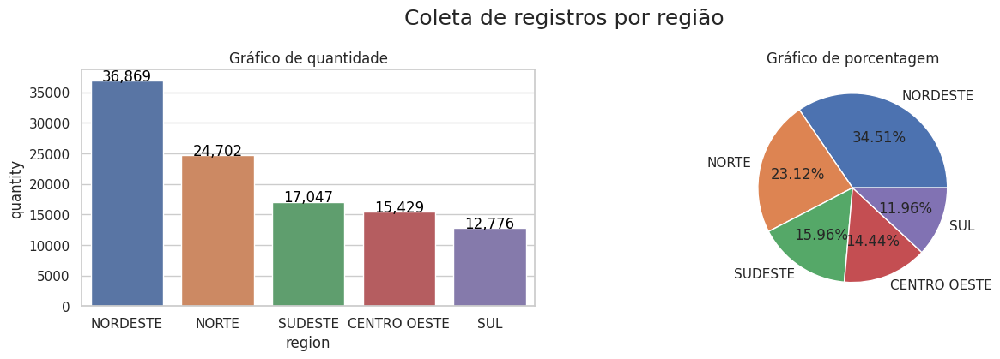

In [15]:
eda_categ_feat_desc_plot(df['region'], 'Coleta de registros por região')

* combustível

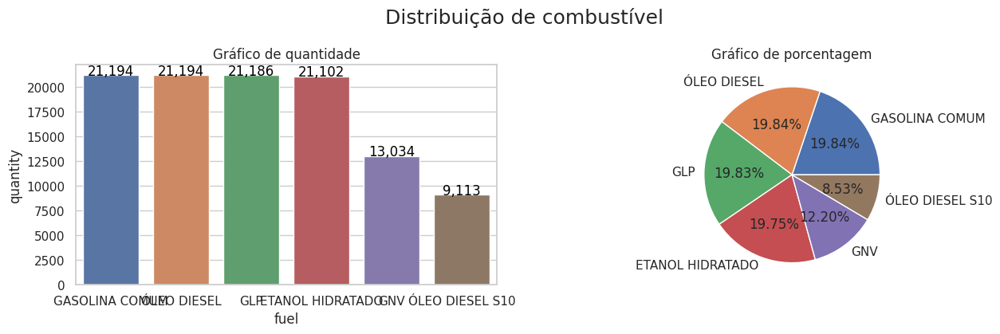

In [16]:
eda_categ_feat_desc_plot(df['fuel'], 'Distribuição de combustível')


* Ano

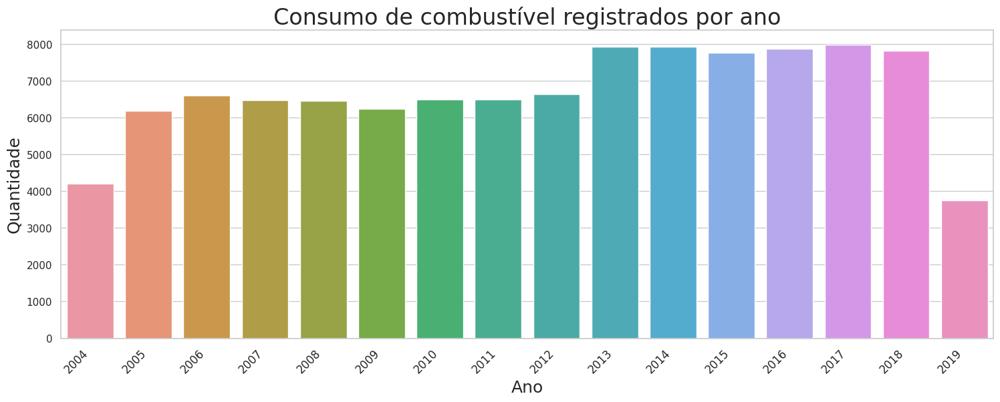

In [17]:
fig, ax = plt.subplots(figsize=(18,6))
ax = sns.countplot(x="year", data=df)
plt.title("Consumo de combustível registrados por ano", fontsize=24)
plt.xlabel('Ano', fontsize=18)
plt.ylabel('Quantidade', fontsize=18)
plt.xticks(rotation=45, fontsize=12, ha='right')
plt.show()

###Preparar Mapa coroplético

**Preparar** brazil-state.geojson

In [18]:
# dict para mapear estados
obj_map_states = {
 'ACRE': 'AC',
 'ALAGOAS': 'AL',
 'AMAPA': 'AP',
 'AMAZONAS': 'AM',
 'BAHIA': 'BA',
 'CEARA': 'CE',
 'DISTRITO FEDERAL': 'DF',
 'ESPIRITO SANTO': 'ES',
 'GOIAS': 'GO',
 'MARANHAO': 'MA' ,
 'MATO GROSSO': 'MT' ,
 'MATO GROSSO DO SUL': 'MS',
 'MINAS GERAIS': 'MG',
 'PARA': 'PA',
 'PARAIBA': 'PB',
 'PARANA': 'PR',
 'PERNAMBUCO': 'PE',
 'PIAUI': 'PI',
 'RIO DE JANEIRO': 'RJ',
 'RIO GRANDE DO NORTE': 'RN',
 'RIO GRANDE DO SUL':  'RS',
 'RONDONIA': 'RO',
 'RORAIMA': 'RR',
 'SANTA CATARINA': 'SC',
 'SAO PAULO': 'SP',
 'SERGIPE': 'SE',
 'TOCANTINS': 'TO'
}
obj_map_states = {v: k for k, v in obj_map_states.items()} # criar um novo dicionário obj_map_states onde as siglas são as chaves e os nomes completos são os valores.

mapping_dict_regions = {'3': 'NORTE', '4': 'NORDESTE', '2': 'SUDESTE', '1': 'SUL', '5': 'CENTRO OESTE'} # Mapeia códigos numéricos para regiões geográficas do Brasil

In [19]:
%pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 22.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 42.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 24.4 MB/s eta 0:00:00


In [20]:
# importar brazil-state.geojson e prepará-lo

import geopandas as gpd

# Abrir geojson
brazil_geojson = gpd.read_file('/content/drive/MyDrive/cruzeiro_do_sul/brazil-states.geojson')
# Organizar
brazil_geojson = brazil_geojson.sort_values('name')
# deletar colunas inúteis
columns_to_drop = ['id', 'codigo_ibg', 'cartodb_id', 'created_at', 'updated_at']
brazil_geojson = brazil_geojson.drop(columns_to_drop, axis = 1)
# Nome do estado do mapa
brazil_geojson['sigla'].tolist()
brazil_geojson['state_sigla'] = brazil_geojson['sigla'].map(lambda v: obj_map_states[v])
# região
brazil_geojson['regiao_id'] = brazil_geojson['regiao_id'].map(mapping_dict_regions)

brazil_geojson.head()

,name,sigla,regiao_id,geometry,state_sigla
0,Acre,AC,NORTE,"MULTIPOLYGON (((-73.60818 -7.20194, -72.86963 ...",ACRE
1,Alagoas,AL,NORDESTE,"MULTIPOLYGON (((-35.46516 -8.82549, -35.46626 ...",ALAGOAS
3,Amapá,AP,NORTE,"MULTIPOLYGON (((-51.18168 4.00889, -51.17900 3...",AMAPA
2,Amazonas,AM,NORTE,"MULTIPOLYGON (((-67.32553 2.03012, -67.32234 2...",AMAZONAS
4,Bahia,BA,NORDESTE,"MULTIPOLYGON (((-39.28820 -8.56290, -39.28229 ...",BAHIA


###EDA sobre o último registro

In [21]:
# cria dict com a última linha para cada produto

dict_fuel_last_row = {}

all_states = df['state'].unique().tolist()
all_fuel = df['fuel'].unique().tolist()
for f in all_fuel:
    # obtém a última linha para cada combustível f para cada um dos 27 estados
    by_state = []
    for s in all_states:
        try:
            by_state.append( df[ (df['fuel'] == f) & (df['state'] == s) ]['start_date'].idxmax() )
        except:
            # Não existe GNV em Roraima
            print('Não existe ...', f,s)
            continue
    dict_fuel_last_row[f] = df.iloc[ by_state ]

Não existe ... GNV RORAIMA


In [22]:
# Copia uma linha de ACRE para RORAIMA

roraima_gnv_row = dict_fuel_last_row['GNV'].loc[dict_fuel_last_row['GNV']['state'] == 'ACRE'].copy()
roraima_gnv_row['state'] = 'RORAIMA'
dict_fuel_last_row['GNV'] = pd.concat([dict_fuel_last_row['GNV'], roraima_gnv_row], ignore_index=True)
len


<function len(obj, /)>

In [23]:
# Crie df_geo (df join geo) e GeoJSONDataSource para cada combustível usando o registro da última data

from bokeh.models import GeoJSONDataSource

dfgeo_fuel_last_row = {}
geosource_fuel_last_row = {}
for key, value in dict_fuel_last_row.items():
    dfgeo_fuel_last_row[key] = brazil_geojson.merge(dict_fuel_last_row[key], left_on = 'state_sigla', right_on = 'state').drop(['start_date', 'end_date'], axis = 1)
    geosource_fuel_last_row[key] = GeoJSONDataSource(geojson = dfgeo_fuel_last_row[key].to_json())

### Gerar gráficos de preços e classificação

Você pode gerar 2 parcelas para último registro de produtos por estado

1. Geoplot
2. Barplot Horizontal (top n preços maiores e preços menores)

Escolha qualquer combinação de combustíveis e preços

preços:

[avg_price, sd_price, min_price, max_price, avg_price_margin, coef_price, dist_avg_price, dist_sd_price, dist_min_price, dist_max_price, coef_dist]

combustível:

['ETANOL HIDRATADO', 'GASOLINA COMUM', 'GLP', 'GNV', 'ÓLEO DIESEL', 'ÓLEO DIESEL S10']

In [24]:
import warnings 
warnings.filterwarnings("ignore")

In [25]:
# Gera um preço/para cada combustível
# type = avg_price, sd_price, min_price, max_price, avg_price_margin, coef_price, dist_avg_price,
#        dist_sd_price, dist_min_price, dist_max_price, coef_dist

type_price = 'avg_price'
geo = {}
rank = {}
for p in geosource_fuel_last_row.keys():
    product = p
    
    geo[p] =  eda_brazil_state_geo_plot( geosource_fuel_last_row[product], dfgeo_fuel_last_row[product], type_price + ' to ' + product, 
                                    type_price, "state", palette = inferno(16) )
    
    rank[p] =   eda_bokeh_horiz_bar_ranked(df = dfgeo_fuel_last_row[product], column_target = type_price,
                                      title = 'Rank: valores mais baixos e mais altos ' + product , int_top = 5, second_target = 'state')

* Preço de avg_price/Preço médio revenda de 'ÓLEO DIESEL S10' por estado no último dia registrado

In [26]:
# Choose One : ['ETANOL HIDRATADO', 'GASOLINA COMUM', 'GLP', 'GNV', 'ÓLEO DIESEL', 'ÓLEO DIESEL S10']

from bokeh.layouts import row

p = 'ÓLEO DIESEL S10'
show( row( geo[p],  rank[p]))

* Preço de avg_price/Preço médio revenda da GASOLINA COMUM (Gás) por estado no último dia registrado

In [27]:
p = 'GASOLINA COMUM'
show( row( geo[p],  rank[p]))

In [28]:
# Analisando Preço médio de Distribuição
type_price = 'dist_avg_price'
geo1 = {}
rank1 = {}
for p in geosource_fuel_last_row.keys():
    product = p
    
    geo1[p] =  eda_brazil_state_geo_plot( geosource_fuel_last_row[product], dfgeo_fuel_last_row[product], type_price + ' to ' + product, 
                                    type_price, "state", palette = inferno(16) )
    
    rank1[p] =   eda_bokeh_horiz_bar_ranked(df = dfgeo_fuel_last_row[product], column_target = type_price,
                                      title = 'Rank: 5 preços mais baixos e 5 mais altos ' + product , int_top = 5, second_target = 'state')

* Preço do dist_avg_price/preço médio distribuição da GASOLINA COMUM por estado no último dia registrado

In [29]:
p = 'GASOLINA COMUM'
show( row( geo1[p],  rank1[p]))

* Preço do dist_avg_price/preço médio distribuição de ÓLEO DIESEL por estado no último dia registrado

In [30]:
p = 'ÓLEO DIESEL'
show( row( geo1[p],  rank1[p]))


* Estados que mais utilizam a gasolina comum

In [31]:
# avg_price, sd_price, min_price, max_price, avg_price_margin, coef_price, 
# dist_avg_price, dist_sd_price, dist_min_price, dist_max_price, coef_dist
type_price = 'coef_dist' # Coeficiente de variação de distribuição

# 'ETANOL HIDRATADO', 'GASOLINA COMUM', 'GLP', 'GNV', 'ÓLEO DIESEL', 'ÓLEO DIESEL S10']
product = 'GASOLINA COMUM' 

geo2 = eda_brazil_state_geo_plot( geosource_fuel_last_row[product], dfgeo_fuel_last_row[product], type_price + ' to ' + product, 
                                    type_price, "state", palette = inferno(16) )
rank2 = eda_bokeh_horiz_bar_ranked(df = dfgeo_fuel_last_row[product], column_target = type_price,
                                      title = 'Estados que mais utilizam ' + product , int_top = 5, second_target = 'state')
    
show( row( geo2, rank2) )

Problema: 

Qual é o estado com maior número de postos de gasolina?

Como cada registro é feito por muitos postos de gasolina, então há duas opções: obter média de postos de gasolina ou número máximo de postos.

In [32]:
# Número máximo de posto_de_gasolina para cada estado

df_gas_s = df.groupby(['state']).max()['n_gas_stations']
df_gas_s.sort_values(ascending = False)

state
SAO PAULO              4167
MINAS GERAIS           1532
SANTA CATARINA         1416
RIO DE JANEIRO         1361
PARANA                  997
RIO GRANDE DO SUL       924
GOIAS                   766
BAHIA                   625
PERNAMBUCO              539
CEARA                   493
DISTRITO FEDERAL        419
AMAZONAS                383
ESPIRITO SANTO          334
MATO GROSSO DO SUL      298
PARA                    272
MATO GROSSO             269
RONDONIA                238
MARANHAO                204
PARAIBA                 200
TOCANTINS               192
RIO GRANDE DO NORTE     183
ALAGOAS                 178
PIAUI                   145
ACRE                    119
SERGIPE                  96
RORAIMA                  93
AMAPA                    55
Name: n_gas_stations, dtype: int64

In [33]:
# média de todos os registros para cada estado

df_gas_s = df.groupby(['state']).mean()['n_gas_stations']
df_gas_s.sort_values(ascending = False)

state
SAO PAULO             1,593.3028
MINAS GERAIS            678.3227
RIO DE JANEIRO          451.1051
PARANA                  410.2449
RIO GRANDE DO SUL       400.2721
BAHIA                   281.3106
GOIAS                   262.2102
SANTA CATARINA          250.0770
PERNAMBUCO              213.5697
CEARA                   171.0863
PARA                    138.8021
ESPIRITO SANTO          130.0305
MATO GROSSO             112.7877
MARANHAO                107.3475
MATO GROSSO DO SUL      103.4699
AMAZONAS                 89.5302
PARAIBA                  81.5125
RONDONIA                 81.4225
DISTRITO FEDERAL         75.4272
RIO GRANDE DO NORTE      75.0702
PIAUI                    71.3819
TOCANTINS                59.3844
ALAGOAS                  57.7976
ACRE                     44.0891
SERGIPE                  37.8732
RORAIMA                  24.4846
AMAPA                    21.8660
Name: n_gas_stations, dtype: float64

In [34]:
df_gas_s = df.groupby(['state']).sum()['n_gas_stations']
df_gas_s.sort_values(ascending = False)

state
SAO PAULO              6792250
MINAS GERAIS           2890333
RIO DE JANEIRO         1923061
PARANA                 1743951
RIO GRANDE DO SUL      1706360
BAHIA                  1199227
SANTA CATARINA         1065828
GOIAS                   960476
PERNAMBUCO              910234
CEARA                   729341
ESPIRITO SANTO          553930
PARA                    485391
MATO GROSSO             455324
MATO GROSSO DO SUL      439333
MARANHAO                375609
AMAZONAS                348183
PARAIBA                 347488
RIO GRANDE DO NORTE     319949
RONDONIA                283269
DISTRITO FEDERAL        262713
PIAUI                   253263
ALAGOAS                 245640
TOCANTINS               206836
SERGIPE                 161302
ACRE                    153430
RORAIMA                  84986
AMAPA                    74410
Name: n_gas_stations, dtype: int64

Solução:

O estado com maior número de postos analisados é **São Paulo**.

Foram realizadas 6.792.250 análises neste estado entre 2004 e 2019, a média de postos por cadastro é de 1.593,302838, o maior número de postos analisados em um único cadastro neste estado é 4167. 

O estado com menor número de postos analisados é o **Amapá**.
Foram realizadas 74.410 análises neste estado entre 2004 e 2019, a média de postos por cadastro é 21.866001, O maior número de postos analisados em um único cadastro neste estado é 55.

Questão: 

Qual estado tem o preço máximo e mínimo do gás (GASOLINA COMUM) 

In [35]:
df_price = df.query("fuel == 'GASOLINA COMUM'").groupby(['state']).mean()['avg_price'].sort_values(ascending = False)
df_price = df_price.to_frame().reset_index()
df_price['name'] = df_price['state'].apply(lambda name: name.capitalize())
df_price.sort_values('avg_price', ascending=False).head()

,state,avg_price,name
0,ACRE,3.4137,Acre
1,MATO GROSSO,3.1791,Mato grosso
2,RONDONIA,3.1750,Rondonia
3,TOCANTINS,3.1666,Tocantins
4,PARA,3.1449,Para


In [36]:
df_avg_all_gas = brazil_geojson.merge(df_price, left_on = 'state_sigla', right_on = 'state').drop(['state_sigla'], axis = 1)

geo_source_avg_all_gas = GeoJSONDataSource(geojson = df_avg_all_gas.to_json())

type_price = 'avg_price'
product = 'GASOLINA COMUM'

geo3 = eda_brazil_state_geo_plot(
    geo_source_avg_all_gas, df_avg_all_gas,
    "avg_price do combustível ('GASOLINA COMUM')", type_price, "state", palette = inferno(16) )

rank3 = eda_bokeh_horiz_bar_ranked(
    df = df_avg_all_gas, column_target = type_price, 
    title = 'Ranking: 5 menores preços e 5 maiores ' + product , int_top = 5, second_target = 'state')
    
show( row( geo3, rank3) )

Observe a evolução do preço do estado com o preço da gasolina mais barata e mais cara.

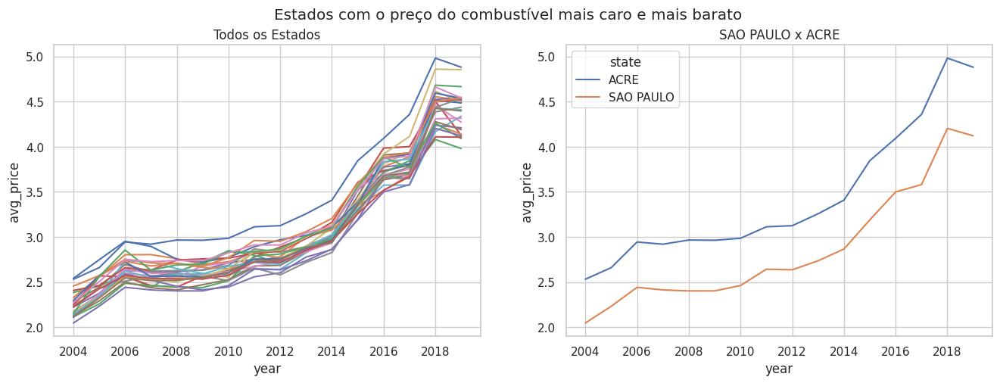

In [37]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.suptitle('Estados com o preço do combustível mais caro e mais barato')

df.query("fuel == 'GASOLINA COMUM' ").groupby(
    ['year','state']).mean()['avg_price'].unstack().plot(ax=ax1, figsize = (16,5), grid = True, legend = False)
ax1.set_ylabel("avg_price")
ax1.set_title("Todos os Estados")

df.query("fuel == 'GASOLINA COMUM' & state in ['SAO PAULO', 'ACRE']").groupby(
    ['year','state']).mean()['avg_price'].unstack().plot(ax=ax2, figsize = (16,5), grid = True)
ax2.set_ylabel("avg_price")
ax2.set_title("SAO PAULO x ACRE")

plt.show()

Solução:

Tirando a média dos preços entre 2004 e 2019, temos que:
 **São Paulo é o mais barato e Acre é o mais caro**

Pergunta:

Qual região é mais cara?

In [38]:
df_re = df.query('fuel == "GASOLINA COMUM" & year == 2019').groupby(['year','region']).mean()['avg_price'].reset_index()

geoplot_region = brazil_geojson.dissolve(by='regiao_id').reset_index()

## Plot region
# geoplot_region['geometry'][1]

drop_columns = ['name', 'sigla', 'year', 'regiao_id']
geoplot_re_final = geoplot_region.merge(df_re, left_on = 'regiao_id', right_on = 'region').drop(drop_columns, axis = 1)
geo_source_region_gas = GeoJSONDataSource(geojson = geoplot_re_final.to_json())

geoplot_re_final.head()

,geometry,state_sigla,region,avg_price
0,"MULTIPOLYGON (((-50.49522 -12.84185, -50.49060...",DISTRITO FEDERAL,CENTRO OESTE,4.3474
1,"MULTIPOLYGON (((-47.03133 -8.98013, -47.03102 ...",ALAGOAS,NORDESTE,4.4196
2,"MULTIPOLYGON (((-66.47027 -9.86845, -66.48050 ...",ACRE,NORTE,4.3825
3,"MULTIPOLYGON (((-47.91351 -25.16685, -47.91141...",ESPIRITO SANTO,SUDESTE,4.5190
4,"MULTIPOLYGON (((-53.41345 -33.11259, -53.41042...",PARANA,SUL,4.2768


In [39]:
# Plot 'GASOLINA COMUM' avg_price/Preço médio revenda em 2019
show(
    eda_brazil_state_geo_plot( geo_source_region_gas, geoplot_re_final, "Preço médio de revenda do gás por região em 2019",
                              'avg_price', "region", palette = inferno(16) )
)

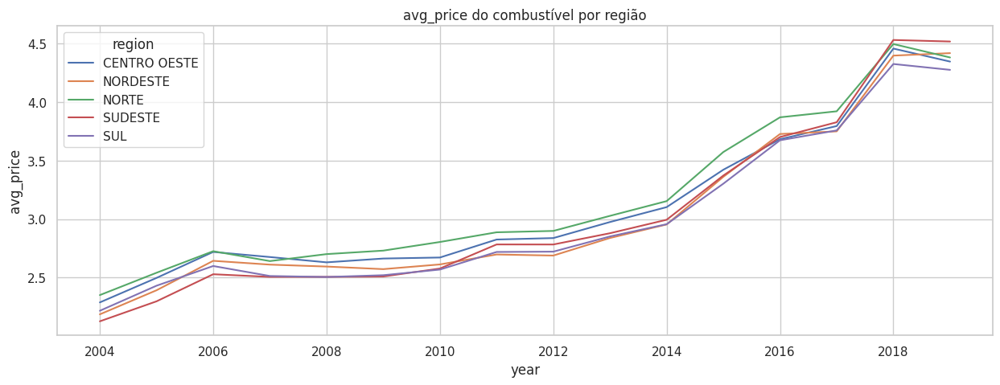

In [40]:
# Evolução do preço do combustível por região desde 2004 a 2019

fig, ax = plt.subplots(figsize=(15,5))
df.query('fuel == "GASOLINA COMUM"').groupby(['year','region']).mean()['avg_price'].unstack().plot(ax=ax)
ax.set_ylabel("avg_price")
ax.set_title("avg_price do combustível por região")
plt.grid(True)

Questão: 

Análise aprofundada dos preços do gás nas regiões.

QUESTÃO:
* Analisar a evolução dos preços por estados entre 2017-2018 e 2017-2019;
* AUMENTO DE PREÇO NO SEMESTRE DE 2018.

Evolução do preço do combustível por região.

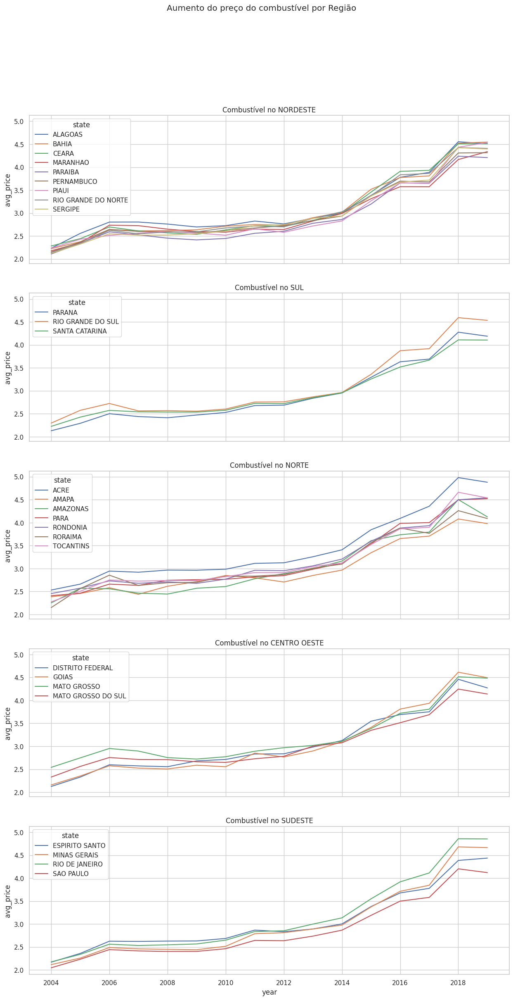

In [41]:
# Evolução do gráfico de cada estado separado por região

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, sharex=True, sharey=True, figsize=(15,15) )
fig.suptitle('Aumento do preço do combustível por Região')

df.query("fuel == 'GASOLINA COMUM' & region == 'NORDESTE' ").groupby(
    ['year','state']).mean()['avg_price'].unstack().plot(ax=ax1, figsize = (15,9), grid = True)
ax1.set_ylabel("avg_price")
ax1.set_title("Combustível no NORDESTE")

df.query("fuel == 'GASOLINA COMUM' & region == 'SUL' ").groupby(
    ['year','state']).mean()['avg_price'].unstack().plot(ax=ax2, figsize = (15,9), grid = True)
ax2.set_ylabel("avg_price")
ax2.set_title("Combustível no SUL")

df.query("fuel == 'GASOLINA COMUM' & region == 'NORTE' ").groupby(
    ['year','state']).mean()['avg_price'].unstack().plot(ax=ax3, figsize = (15,9), grid = True)
ax3.set_ylabel("avg_price")
ax3.set_title("Combustível no NORTE")

df.query("fuel == 'GASOLINA COMUM' & region == 'CENTRO OESTE' ").groupby(
    ['year','state']).mean()['avg_price'].unstack().plot(ax=ax4, figsize = (15,9), grid = True)
ax4.set_ylabel("avg_price")
ax4.set_title("Combustível no CENTRO OESTE")

df.query("fuel == 'GASOLINA COMUM' & region == 'SUDESTE' ").groupby(
    ['year','state']).mean()['avg_price'].unstack().plot(ax=ax5, figsize = (15, 27), grid = True)
ax5.set_ylabel("avg_price")
ax5.set_title("Combustível no SUDESTE")

plt.show()

###Crescimento do preço do combustível nos últimos anos



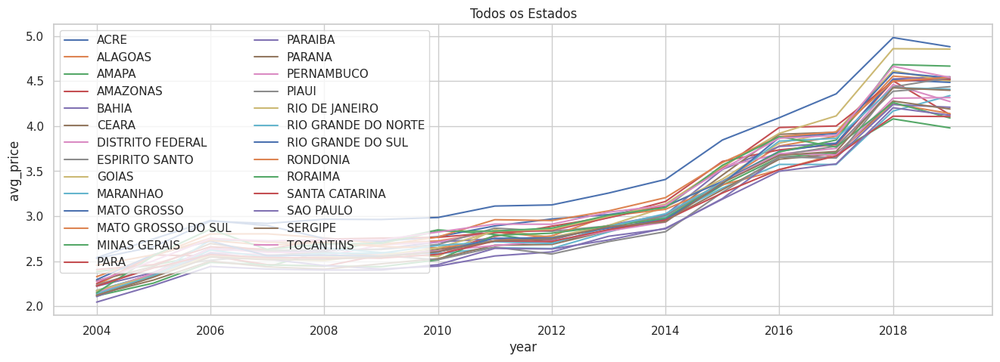

In [42]:
# Plotar a média do preço de todos os estados por ano

fig, ax1 = plt.subplots(figsize=(15,7))
df.query("fuel == 'GASOLINA COMUM' ").groupby(
    ['year','state']).mean()['avg_price'].unstack().plot(ax=ax1, figsize = (16,5), grid = True)
ax1.set_ylabel("avg_price")
ax1.set_title("Todos os Estados")
plt.legend(bbox_to_anchor=(0, 1), loc='upper left', ncol=2)

plt.show()

Entre 2017 e 2018

In [43]:
# Gerar dataframe 'df diff 2017_2018' com o aumento do preço do combustível entre 2017 e 2018

diff = df.query("fuel == 'GASOLINA COMUM' ").groupby(['year','state']).mean()['avg_price'].reset_index()

diff_2017 = diff.query('year == 2017')
diff_2018 = diff.query('year == 2018')


rename_columns = {'avg_price_x': 'avg_price_2018', 'avg_price_y': 'avg_price_2017'}

df_diff_2017_2018 = diff_2018.merge(diff_2017, left_on = 'state', right_on = 'state').rename(
    rename_columns, axis = 1).drop(['year_x','year_y'], axis = 1)

df_diff_2017_2018['increase'] = df_diff_2017_2018['avg_price_2018'] - df_diff_2017_2018['avg_price_2017']
df_diff_2017_2018.sort_values('increase', ascending = False).head()

,state,avg_price_2018,avg_price_2017,increase
12,MINAS GERAIS,4.6815,3.8452,0.8363
17,PIAUI,4.4347,3.6454,0.7893
26,TOCANTINS,4.6618,3.8966,0.7652
18,RIO DE JANEIRO,4.8581,4.1128,0.7453
4,BAHIA,4.5224,3.8105,0.7119


In [44]:
# Trace a diferença de preço do combustível entre 2017 e 2018

df_geo_diff_2017_2018 = brazil_geojson.merge(df_diff_2017_2018, left_on = 'state_sigla', right_on = 'state').drop(['sigla'], axis = 1)
df_geo_diff_2017_2018.head()

geo_source_diff_2017_2018 = GeoJSONDataSource(geojson = df_geo_diff_2017_2018.to_json())

type_price = 'increase'

geo_plot = eda_brazil_state_geo_plot( geo_source_diff_2017_2018, df_geo_diff_2017_2018, "Aumento da gasolina entre 2017 e 2018", type_price, "state", palette = inferno(16) )

rank_plot = eda_bokeh_horiz_bar_ranked(df = df_geo_diff_2017_2018, column_target = type_price,
                                      title = 'Rank: Primeiros e últimos 8 estados que tiveram aumento ' , int_top = 8, second_target = 'state')
    
show( row( geo_plot, rank_plot) )

Entre 2018 e 2019

In [45]:
# Gerar dataframe 'df diff 2017_2018' com o aumento do preço do combustível entre 2017 e 2018

diff = df.query("fuel == 'GASOLINA COMUM' ").groupby(['year','state']).mean()['avg_price'].reset_index()

diff_2017 = diff.query('year == 2017')
diff_2018 = diff.query('year == 2018')
diff_2019 = diff.query('year == 2019')


rename_columns = {'avg_price_x': 'avg_price_2018', 'avg_price_y': 'avg_price_2017'}

df_diff_2017_2018 = diff_2018.merge(diff_2017, left_on = 'state', right_on = 'state').rename(rename_columns, axis = 1)

df_diff_2017_2019 = diff_2019.merge(df_diff_2017_2018, left_on = 'state', right_on = 'state')

df_diff_2017_2019

df_diff_2017_2019['increase2'] = df_diff_2017_2019['avg_price'] - df_diff_2017_2019['avg_price_2018']
df_diff_2017_2019.sort_values('increase2', ascending = False).head()

,year,state,avg_price,year_x,avg_price_2018,year_y,avg_price_2017,increase2
9,2019,MARANHAO,4.3379,2018,4.1668,2017,3.5737,0.1711
17,2019,PIAUI,4.5371,2018,4.4347,2017,3.6454,0.1024
7,2019,ESPIRITO SANTO,4.4367,2018,4.3856,2017,3.7772,0.0512
21,2019,RONDONIA,4.5410,2018,4.4990,2017,3.9347,0.0420
13,2019,PARA,4.5217,2018,4.4971,2017,4.0008,0.0246


In [46]:
df_geo_diff_2017_2019 = brazil_geojson.merge(df_diff_2017_2019, left_on = 'state_sigla', right_on = 'state').drop(['state_sigla'], axis = 1)

geo_source_diff_2017_2019 = GeoJSONDataSource(geojson = df_geo_diff_2017_2019.to_json())

type_price = 'increase2'

geo_plot = eda_brazil_state_geo_plot( geo_source_diff_2017_2019, df_geo_diff_2017_2019, "Aumento da gasolina entre 2018 e 2019",
                                     type_price, "state", palette = inferno(32) )

rank_plot = eda_bokeh_horiz_bar_ranked(df = df_geo_diff_2017_2019, column_target = type_price,
                                      title = 'Rank: Primeiros e últimos 8 estados que tiveram aumento' , int_top = 8, second_target = 'state')
    
show( row( geo_plot, rank_plot) )

Crescimento do preço nas regiões registrado nos últimos anos

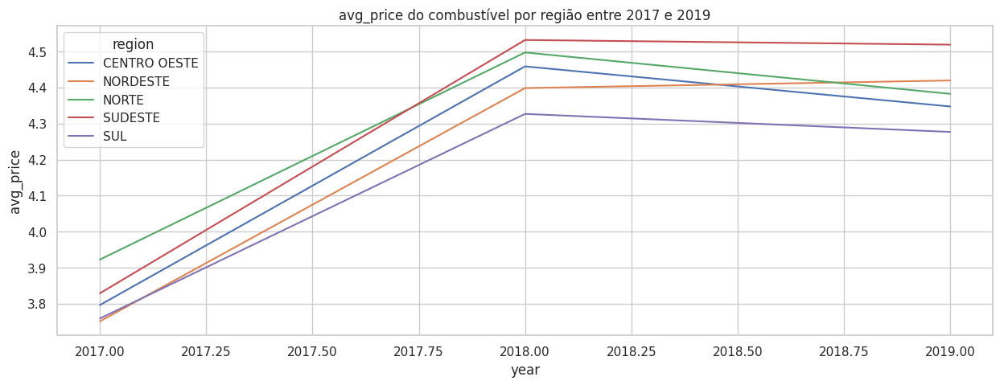

In [47]:
# Traçar a evolução do preço do Combustível por região entre 2017 e 2019

fig, ax = plt.subplots(figsize=(15,5))
df.query('fuel == "GASOLINA COMUM" & year in [2017, 2018, 2019]' ).groupby(['year','region']).mean()['avg_price'].unstack().plot(ax=ax)
ax.set_ylabel("avg_price")
ax.set_title("avg_price do combustível por região entre 2017 e 2019")
plt.grid(True)
plt.show()

###Conclusão sobre o aumento do preço da gasolina nos estados e regiões e como o sudeste se tornou a região mais cara?

* **Como o sudeste se tornou a região mais cara?** O Sudeste se tornou a região mais cara porque: Minas Gerais e Rio de Janeiro tiveram o maior aumento no preço da gasolina entre 2017 e 2018, sendo o primeiro e o quarto maiores aumentos, respectivamente. Além disso, como a região SUDESTE tem poucos estados, esse aumento tem mais impacto no cálculo das regiões.

* Entre 2018 e 2019 vemos que o preço no Nordeste cresceu, saindo da quarta colocação com maior preço e indo para o segundo lugar.
**A região Nordeste teve grande aumento nos estados:** Maranhão, Piauí e Bahia, e em sua grande maioria a redução de preços prevaleceu na região, sendo assim ficando em segundo lugar.


* A região Centro-Oeste, Norte e Sul tiveram queda semelhante Nos estados do Norte, enquanto houve alguns com aumento (como Rondônia, o quinto maior aumento), houve outros que tiveram grande redução (Amazona e Roraima), ambos prevalecendo sobre o estado como um todo. 

* A região Sudeste ficou estagnada. O Sudeste teve queda na maioria dos estados, mas o Espírito Santo que teve os 3 aumentos atrapalha. A região diminuiu de preço, mas não tanto. 

**Conclusão:** Apesar da tendência de queda de preços em todos os estados, a região sudeste estagnou e a região nordeste aumentou enquanto as demais ficaram mais baratas.